In [3]:
%pip install "dask[complete]"
%pip install dask-ml
%pip install aiofiles

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [4]:
import pandas as pd
import numpy as np
import glob
import os
import time
import asyncio
import aiofiles
from io import StringIO
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

import juliandate as jd #jd.to_gregorian(1705426), jd.to_julian(1705426.5), jd.from_gregorian(1969, 7, 20, 20, 17, 0, 0), jd.from_julian(-43, 3, 15, 0, 0, 0, 0)

# Asteroid Data

### Import and join files. Multiple files were downloaded due to the size of the combined data caused downloading issues

In [5]:
start_time = time.time()

Amor = pd.read_csv("data/Amor.csv", index_col = False)
Apollo = pd.read_csv("data/Apollo.csv", index_col = False)
Aten = pd.read_csv("data/Aten.csv", index_col = False)
Atira = pd.read_csv("data/Atira.csv", index_col = False)
Centaur = pd.read_csv("data/Centaur.csv", index_col = False)
Hyperbolic = pd.read_csv("data/Hyperbolic.csv", index_col = False)
Inner_Main_belt = pd.read_csv("data/Inner_Main-belt.csv", index_col = False)
Jupyter_Trojan = pd.read_csv("data/Jupyter_Trojan.csv", index_col = False)
Mars_crossing = pd.read_csv("data/Mars-crossing.csv", index_col = False)
Other = pd.read_csv("data/Other.csv", index_col = False)
Outer_Main_belt = pd.read_csv("data/Outer_Main-belt.csv", index_col = False)
TransNeptunian_Object = pd.read_csv("data/TransNeptunian_Object.csv", index_col = False)

C:\Users\stack\AppData\Local\Temp\ipykernel_13764\2153364029.py:3: DtypeWarning: Columns (3,16,23,24,70) have mixed types. Specify dtype option on import or set low_memory=False.
  Amor = pd.read_csv("data/Amor.csv", index_col = False)
C:\Users\stack\AppData\Local\Temp\ipykernel_13764\2153364029.py:4: DtypeWarning: Columns (3,16,23,24,70) have mixed types. Specify dtype option on import or set low_memory=False.
  Apollo = pd.read_csv("data/Apollo.csv", index_col = False)
C:\Users\stack\AppData\Local\Temp\ipykernel_13764\2153364029.py:9: DtypeWarning: Columns (2,3,23,24,70) have mixed types. Specify dtype option on import or set low_memory=False.
  Inner_Main_belt = pd.read_csv("data/Inner_Main-belt.csv", index_col = False)
C:\Users\stack\AppData\Local\Temp\ipykernel_13764\2153364029.py:10: DtypeWarning: Columns (3,23,24) have mixed types. Specify dtype option on import or set low_memory=False.
  Jupyter_Trojan = pd.read_csv("data/Jupyter_Trojan.csv", index_col = False)
C:\Users\stack\A

In [6]:
data_dir = "data/Main_belt/"
dfs = []
for i in range(1, 81, 10):  # Goes from 1 to 80, step 10
    file_path = os.path.join(data_dir, f"Main-belt_{i}-{i+9}.csv")
    dfs.append(pd.read_csv(file_path, index_col = False))
main_belt = dfs[0]
for df in dfs[1:]:
    main_belt = main_belt.merge(df, on='spkid')

main_belt

C:\Users\stack\AppData\Local\Temp\ipykernel_13764\1212843660.py:5: DtypeWarning: Columns (2,3) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs.append(pd.read_csv(file_path, index_col = False))
C:\Users\stack\AppData\Local\Temp\ipykernel_13764\1212843660.py:5: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs.append(pd.read_csv(file_path, index_col = False))
C:\Users\stack\AppData\Local\Temp\ipykernel_13764\1212843660.py:5: DtypeWarning: Columns (5,6) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs.append(pd.read_csv(file_path, index_col = False))
C:\Users\stack\AppData\Local\Temp\ipykernel_13764\1212843660.py:5: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  dfs.append(pd.read_csv(file_path, index_col = False))


,spkid,full_name,pdes,name,prefix,neo,pha,sats,H,G,...,rms,two_body,A1,A1_sigma,A2,A2_sigma,A3,A3_sigma,DT,DT_sigma
0,20000001,1 Ceres (A801 AA),1,Ceres,NaN,N,N,0,3.34,0.12,...,0.43153,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20000002,2 Pallas (A802 FA),2,Pallas,NaN,N,N,0,4.12,0.11,...,0.35797,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20000003,3 Juno (A804 RA),3,Juno,NaN,N,N,0,5.18,0.32,...,0.35432,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,20000004,4 Vesta (A807 FA),4,Vesta,NaN,N,N,0,3.25,0.32,...,0.40095,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,20000005,5 Astraea (A845 XA),5,Astraea,NaN,N,N,0,6.99,NaN,...,0.48751,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1247913,54484275,(2024 SX3),2024 SX3,NaN,NaN,N,NaN,0,20.08,NaN,...,1.09000,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1247914,54484276,(2024 SY3),2024 SY3,NaN,NaN,N,NaN,0,18.96,NaN,...,1.05000,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1247915,54484272,(2024 SB4),2024 SB4,NaN,NaN,N,NaN,0,17.67,NaN,...,0.30000,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1247916,3246764,(4847 P-L),4847 P-L,NaN,NaN,N,N,0,18.11,NaN,...,0.51459,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
asteroid_raw = pd.concat([main_belt, Amor, Apollo, Aten, Atira, Centaur, Hyperbolic, Inner_Main_belt,
                     Jupyter_Trojan, Mars_crossing, Other, Outer_Main_belt, TransNeptunian_Object], axis=0)

In [8]:
compression_opts = dict(method='zip',
                        archive_name='Asteroid.csv')  
asteroid_raw.to_csv('data/Asteroid.zip', index=False,
          compression=compression_opts) 

In [9]:
end_time = time.time()
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

Execution time: 76.11 seconds


In [15]:
async def read_csv_async(filepath):
    async with aiofiles.open(filepath, mode='r') as file:
        content = await file.read()
    return pd.read_csv(StringIO(content), index_col=False)

async def load_main_belt():
    data_dir = "data/Main_belt/"
    dfs = []
    tasks = []
    # Prepare tasks for reading each Main_belt file asynchronously
    for i in range(1, 81, 10):
        file_path = os.path.join(data_dir, f"Main-belt_{i}-{i+9}.csv")
        tasks.append(read_csv_async(file_path))

    dfs = await asyncio.gather(*tasks)

    main_belt = dfs[0]
    for df in dfs[1:]:
        main_belt = main_belt.merge(df, on='spkid')
    
    return main_belt

async def load_other_class():
    # File paths for non-main-belt data
    files = [
        "data/Amor.csv", "data/Apollo.csv", "data/Aten.csv", "data/Atira.csv", 
        "data/Centaur.csv", "data/Hyperbolic.csv", "data/Inner_Main-belt.csv",
        "data/Jupyter_Trojan.csv", "data/Mars-crossing.csv", "data/Other.csv",
        "data/Outer_Main-belt.csv", "data/TransNeptunian_Object.csv"
    ]

    tasks = [read_csv_async(file) for file in files]
    dfs = await asyncio.gather(*tasks)
    return dfs

async def main():
    # Load data concurrently
    main_belt, other_data_dfs = await asyncio.gather(load_main_belt(), load_other_class())
    
    # Concatenate all data into a single DataFrame
    asteroid_raw = pd.concat([main_belt] + other_data_dfs, axis=0)
    
    # Save to compressed zip file
    compression_opts = dict(method='zip', archive_name='Asteroid.csv')  
    asteroid_raw.to_csv('data/Asteroid.zip', index=False, compression=compression_opts)

In [16]:
start_time = time.time()
async def run_async_code():
    await main()

await run_async_code()
end_time = time.time()
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

C:\Users\stack\AppData\Local\Temp\ipykernel_13764\3320690830.py:4: DtypeWarning: Columns (3,16,23,24,70) have mixed types. Specify dtype option on import or set low_memory=False.
  return pd.read_csv(StringIO(content), index_col=False)
C:\Users\stack\AppData\Local\Temp\ipykernel_13764\3320690830.py:4: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  return pd.read_csv(StringIO(content), index_col=False)
C:\Users\stack\AppData\Local\Temp\ipykernel_13764\3320690830.py:4: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  return pd.read_csv(StringIO(content), index_col=False)
C:\Users\stack\AppData\Local\Temp\ipykernel_13764\3320690830.py:4: DtypeWarning: Columns (5,6) have mixed types. Specify dtype option on import or set low_memory=False.
  return pd.read_csv(StringIO(content), index_col=False)
C:\Users\stack\AppData\Local\Temp\ipykernel_13764\3320690830.py:4: DtypeWarning: Columns (

Execution time: 73.75 seconds


### Import raw asteroid data

In [17]:
asteroid_raw = pd.read_csv("data/Asteroid.zip", compression = 'zip')

C:\Users\stack\AppData\Local\Temp\ipykernel_13764\3245021429.py:1: DtypeWarning: Columns (2,3,4,16,24,25,71) have mixed types. Specify dtype option on import or set low_memory=False.
  asteroid_raw = pd.read_csv("data/Asteroid.zip", compression = 'zip')


In [18]:
asteroid_raw.columns

Index(['spkid', 'full_name', 'pdes', 'name', 'prefix', 'neo', 'pha', 'sats',
       'H', 'G', 'M1', 'M2', 'K1', 'K2', 'PC', 'diameter', 'extent', 'albedo',
       'rot_per', 'GM_x', 'GM_y', 'BV', 'UB', 'IR', 'spec_B', 'spec_T',
       'H_sigma', 'diameter_sigma', 'orbit_id', 'epoch', 'epoch_mjd',
       'epoch_cal', 'equinox', 'e', 'a', 'q', 'i', 'om', 'w', 'ma', 'ad', 'n',
       'tp', 'tp_cal', 'per', 'per_y', 'moid', 'moid_ld', 'moid_jup', 't_jup',
       'sigma_e', 'sigma_a', 'sigma_q', 'sigma_i', 'sigma_om', 'sigma_w',
       'sigma_ma', 'sigma_ad', 'sigma_n', 'sigma_tp', 'sigma_per', 'class',
       'producer', 'data_arc', 'first_obs', 'last_obs', 'n_obs_used',
       'n_del_obs_used', 'n_dop_obs_used', 'condition_code', 'rms', 'two_body',
       'A1', 'A1_sigma', 'A2', 'A2_sigma', 'A3', 'A3_sigma', 'DT', 'DT_sigma',
       'GM'],
      dtype='object')

##### Check if GM columns are equal, if so one can be dropped

In [19]:
asteroid_raw['GM_x'].equals(asteroid_raw['GM_y'])

True

In [20]:
asteroid_raw.drop(['GM_y'], axis = 1, inplace = True)

In [21]:
asteroid_raw['GM_x'].equals(asteroid_raw['GM'])

False

In [22]:
asteroid_raw['GM_x']

0          62.628400
1          13.630000
2                NaN
3          17.288245
4                NaN
             ...    
1405015          NaN
1405016          NaN
1405017          NaN
1405018          NaN
1405019          NaN
Name: GM_x, Length: 1405020, dtype: float64

In [23]:
asteroid_raw['GM']

0         NaN
1         NaN
2         NaN
3         NaN
4         NaN
           ..
1405015   NaN
1405016   NaN
1405017   NaN
1405018   NaN
1405019   NaN
Name: GM, Length: 1405020, dtype: float64

In [24]:
asteroid_raw['GM'].isnull().sum()

1405014

In [25]:
asteroid_raw[asteroid_raw[['GM']].notnull().all(1)]

,spkid,full_name,pdes,name,prefix,neo,pha,sats,H,G,...,two_body,A1,A1_sigma,A2,A2_sigma,A3,A3_sigma,DT,DT_sigma,GM
1247918,20000433,433 Eros (A898 PA),433,Eros,NaN,Y,N,0,10.41,0.46,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.463000e-04
1260812,20025143,25143 Itokawa (1998 SF36),25143,Itokawa,NaN,Y,Y,0,19.26,NaN,...,NaN,NaN,NaN,-2.800000e-14,8.200000e-15,NaN,NaN,NaN,NaN,2.100000e-09
1260903,20101955,101955 Bennu (1999 RQ36),101955,Bennu,NaN,Y,Y,0,20.21,-0.03,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.890400e-09
1261056,20162173,162173 Ryugu (1999 JU3),162173,Ryugu,NaN,Y,Y,0,19.55,NaN,...,NaN,NaN,NaN,-2.500000e-14,8.500000e-15,NaN,NaN,NaN,NaN,3.000000e-08
1261144,20185851,185851 (2000 DP107),185851,NaN,NaN,Y,Y,1,18.32,NaN,...,NaN,NaN,NaN,9.600000e-15,6.300000e-16,NaN,NaN,NaN,NaN,3.224000e-08
1356124,20000107,107 Camilla (A868 WA),107,Camilla,NaN,N,N,2,7.13,0.08,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.475000e-01


In [26]:
asteroid_raw['GM_x'].iloc[[1247918, 1260812, 1260903, 1261056, 1261144, 1356124]]

1247918   NaN
1260812   NaN
1260903   NaN
1261056   NaN
1261144   NaN
1356124   NaN
Name: GM_x, dtype: float64

##### After reviewing the difference between GM and GM_x, it appears that there are only 6 values in GM which are null in GM_x. Therefore the values will be combined into one column

In [27]:
asteroid_raw.loc[1247918, 'GM_x'] = asteroid_raw.loc[1247918, 'GM']
asteroid_raw.loc[1260812, 'GM_x'] = asteroid_raw.loc[1260812, 'GM']
asteroid_raw.loc[1260903, 'GM_x'] = asteroid_raw.loc[1260903, 'GM']
asteroid_raw.loc[1261056, 'GM_x'] = asteroid_raw.loc[1261056, 'GM']
asteroid_raw.loc[1261144, 'GM_x'] = asteroid_raw.loc[1261144, 'GM']
asteroid_raw.loc[1356124, 'GM_x'] = asteroid_raw.loc[1356124, 'GM']

In [28]:
asteroid_raw['GM_x'].iloc[[1247918, 1260812, 1260903, 1261056, 1261144, 1356124]]

1247918    4.463000e-04
1260812    2.100000e-09
1260903    4.890400e-09
1261056    3.000000e-08
1261144    3.224000e-08
1356124    7.475000e-01
Name: GM_x, dtype: float64

In [29]:
asteroid_raw.drop(['GM'], axis = 1, inplace = True)

In [30]:
asteroid_raw = asteroid_raw.rename(columns = {'GM_x': 'GM'})

In [31]:
asteroid_raw.shape

(1405020, 79)

In [32]:
asteroid_raw.columns

Index(['spkid', 'full_name', 'pdes', 'name', 'prefix', 'neo', 'pha', 'sats',
       'H', 'G', 'M1', 'M2', 'K1', 'K2', 'PC', 'diameter', 'extent', 'albedo',
       'rot_per', 'GM', 'BV', 'UB', 'IR', 'spec_B', 'spec_T', 'H_sigma',
       'diameter_sigma', 'orbit_id', 'epoch', 'epoch_mjd', 'epoch_cal',
       'equinox', 'e', 'a', 'q', 'i', 'om', 'w', 'ma', 'ad', 'n', 'tp',
       'tp_cal', 'per', 'per_y', 'moid', 'moid_ld', 'moid_jup', 't_jup',
       'sigma_e', 'sigma_a', 'sigma_q', 'sigma_i', 'sigma_om', 'sigma_w',
       'sigma_ma', 'sigma_ad', 'sigma_n', 'sigma_tp', 'sigma_per', 'class',
       'producer', 'data_arc', 'first_obs', 'last_obs', 'n_obs_used',
       'n_del_obs_used', 'n_dop_obs_used', 'condition_code', 'rms', 'two_body',
       'A1', 'A1_sigma', 'A2', 'A2_sigma', 'A3', 'A3_sigma', 'DT', 'DT_sigma'],
      dtype='object')

In [33]:
null_columns = asteroid_raw.columns[asteroid_raw.isnull().all()]
null_columns

Index(['M1', 'M2', 'K1', 'K2', 'PC', 'DT', 'DT_sigma'], dtype='object')

In [34]:
null_count = pd.DataFrame()
null_count = asteroid_raw.isnull().sum()
columns_with_nulls = null_count[null_count > 0]
print(columns_with_nulls)

name              1380100
prefix            1405001
neo                     2
pha                 15399
H                    1001
G                 1404901
M1                1405020
M2                1405020
K1                1405020
K2                1405020
PC                1405020
diameter          1265415
extent            1405000
albedo            1266540
rot_per           1370918
GM                1405005
BV                1403999
UB                1404041
IR                1405019
spec_B            1403354
spec_T            1404040
H_sigma            890050
diameter_sigma    1265540
ma                      1
ad                      2
per                     2
per_y                   2
moid                15398
moid_ld             15398
moid_jup            15398
t_jup                   2
sigma_e             15399
sigma_a             15399
sigma_q             15399
sigma_i             15399
sigma_om            15399
sigma_w             15399
sigma_ma            15399
sigma_ad    

In [35]:
not_null = null_count[null_count == 0].index
not_null

Index(['spkid', 'full_name', 'pdes', 'sats', 'orbit_id', 'epoch', 'epoch_mjd',
       'epoch_cal', 'equinox', 'e', 'a', 'q', 'i', 'om', 'w', 'n', 'tp',
       'tp_cal', 'class', 'producer', 'first_obs', 'last_obs', 'n_obs_used'],
      dtype='object')

##### The "null_columns" columns are related to comets and not asteroids, so they can be dropped from the asteroid data. In addtion there are several id's and names available that duplicate each other so these will be dropped. In order to shrink the dataset to a size that hopefully will be more manageable, I have decided to delete the rows with sigma -- which indicate uncertainty of a given value. Also columns with mostly NaN

In [36]:
asteroid_raw.drop(null_columns, axis = 1, inplace = True)
asteroid_raw.drop(['prefix', 'name', 'pdes', 'sigma_e', 'sigma_a', 'sigma_q', 'sigma_i', 'sigma_om', 'sigma_w', 'H_sigma', 
               'sigma_ma', 'sigma_ad', 'sigma_n', 'sigma_tp', 'sigma_per', 'A1_sigma', 'A2_sigma', 'A3_sigma', 'A1', 'A2', 'A3',
              'diameter_sigma', 'n_del_obs_used', 'n_dop_obs_used', 'extent', 'GM', 'IR', ], axis = 1, inplace = True)

In [37]:
compression_opts = dict(method='zip',
                        archive_name='Asteroid_Cleaned_Columns.csv')  
asteroid_raw.to_csv('data/Asteroid_Cleaned_Columns.zip', index=False,
          compression=compression_opts) 

# Import Asteroid data with cleaned columns

In [38]:
asteroid_not_cleaned = pd.read_csv('data/Asteroid_Cleaned_Columns.zip', compression = 'zip')
asteroid_not_cleaned

C:\Users\stack\AppData\Local\Temp\ipykernel_13764\871830418.py:1: DtypeWarning: Columns (12,13,44) have mixed types. Specify dtype option on import or set low_memory=False.
  asteroid_not_cleaned = pd.read_csv('data/Asteroid_Cleaned_Columns.zip', compression = 'zip')


,spkid,full_name,neo,pha,sats,H,G,diameter,albedo,rot_per,...,t_jup,class,producer,data_arc,first_obs,last_obs,n_obs_used,condition_code,rms,two_body
0,20000001,1 Ceres (A801 AA),N,N,0,3.34,0.12,939.400,0.0900,9.074170,...,3.31,MBA,Davide Farnocchia,9520.0,1995-01-05,2021-01-28,1075,0.0,0.43153,NaN
1,20000002,2 Pallas (A802 FA),N,N,0,4.12,0.11,513.000,0.1550,7.813221,...,3.04,MBA,Otto Matic,80309.0,1804-08-27,2024-07-13,9724,0.0,0.35797,NaN
2,20000003,3 Juno (A804 RA),N,N,0,5.18,0.32,246.596,0.2140,7.210000,...,3.30,MBA,Otto Matic,80222.0,1804-10-17,2024-06-07,8269,0.0,0.35432,NaN
3,20000004,4 Vesta (A807 FA),N,N,0,3.25,0.32,525.400,0.4228,5.342128,...,3.54,MBA,Davide Farnocchia,25743.0,1950-09-23,2021-03-17,9451,0.0,0.40095,NaN
4,20000005,5 Astraea (A845 XA),N,N,0,6.99,NaN,106.699,0.2740,16.806000,...,3.40,MBA,Otto Matic,65184.0,1845-12-15,2024-06-03,4204,0.0,0.48751,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1405015,54467487,(2024 PP8),N,N,0,15.76,NaN,NaN,NaN,NaN,...,-1.46,TNO,Otto Matic,24.0,2024-08-15,2024-09-08,33,7.0,0.34114,NaN
1405016,54471385,(2024 PL17),N,N,0,11.02,NaN,NaN,NaN,NaN,...,-2.40,TNO,Otto Matic,339.0,2023-10-05,2024-09-08,16,5.0,0.57793,NaN
1405017,54467533,(2024 QX1),N,N,0,16.05,NaN,NaN,NaN,NaN,...,-1.73,TNO,Otto Matic,58.0,2024-07-09,2024-09-05,29,4.0,0.34844,NaN
1405018,54470423,(2024 RQ11),N,N,0,17.13,NaN,NaN,NaN,NaN,...,-1.28,TNO,Otto Matic,8.0,2024-09-01,2024-09-09,16,8.0,0.46440,NaN


In [39]:
asteroid_not_cleaned.describe

<bound method NDFrame.describe of             spkid                 full_name neo pha  sats      H     G  \
0        20000001         1 Ceres (A801 AA)   N   N     0   3.34  0.12   
1        20000002        2 Pallas (A802 FA)   N   N     0   4.12  0.11   
2        20000003          3 Juno (A804 RA)   N   N     0   5.18  0.32   
3        20000004         4 Vesta (A807 FA)   N   N     0   3.25  0.32   
4        20000005       5 Astraea (A845 XA)   N   N     0   6.99   NaN   
...           ...                       ...  ..  ..   ...    ...   ...   
1405015  54467487                (2024 PP8)   N   N     0  15.76   NaN   
1405016  54471385               (2024 PL17)   N   N     0  11.02   NaN   
1405017  54467533                (2024 QX1)   N   N     0  16.05   NaN   
1405018  54470423               (2024 RQ11)   N   N     0  17.13   NaN   
1405019  54471383               (2024 RA22)   N   N     0   8.87   NaN   

         diameter  albedo    rot_per  ...  t_jup  class           producer  \

In [40]:
print(asteroid_not_cleaned.dtypes)

spkid               int64
full_name          object
neo                object
pha                object
sats                int64
H                 float64
G                 float64
diameter          float64
albedo            float64
rot_per           float64
BV                float64
UB                float64
spec_B             object
spec_T             object
orbit_id           object
epoch             float64
epoch_mjd           int64
epoch_cal          object
equinox            object
e                 float64
a                 float64
q                 float64
i                 float64
om                float64
w                 float64
ma                float64
ad                float64
n                 float64
tp                float64
tp_cal             object
per               float64
per_y             float64
moid              float64
moid_ld           float64
moid_jup          float64
t_jup             float64
class              object
producer           object
data_arc    

In [41]:
asteroid_not_cleaned.nunique()

spkid             1405020
full_name         1405020
neo                     2
pha                     2
sats                    5
H                    2662
G                      46
diameter            16781
albedo               1054
rot_per             22479
BV                    307
UB                    339
spec_B                 34
spec_T                131
orbit_id              739
epoch                5761
epoch_mjd            5761
epoch_cal            5761
equinox                 1
e                    8515
a                    8416
q                    9548
i                    5136
om                  36001
w                   36001
ma                  36003
ad                   4148
n                   13013
tp                 251789
tp_cal              56816
per                  2435
per_y                2530
moid                 4405
moid_ld              4492
moid_jup             3218
t_jup                 913
class                  13
producer               15
data_arc    

### Review and change categorical data to encoded

In [42]:
asteroid_not_cleaned['producer'].nunique()

15

In [43]:
asteroid_not_cleaned['producer'].unique()

array(['Davide Farnocchia', 'Otto Matic', 'Ryan S. Park', 'Bardwell',
       'Veres', 'Pan', 'MPCLINUX', 'Bell', 'Giorgini', 'Williams',
       'Steve Chesley', 'Alexanders', 'Spoto', 'MPCW', 'R.S. Park'],
      dtype=object)

In [44]:
asteroid_not_cleaned['class'].nunique()

13

In [45]:
asteroid_not_cleaned['class'].unique()

array(['MBA', 'AMO', 'APO', 'ATE', 'IEO', 'CEN', 'HYA', 'IMB', 'TJN',
       'MCA', 'AST', 'OMB', 'TNO'], dtype=object)

In [46]:
enc = preprocessing.OrdinalEncoder()
asteroid_not_cleaned['class'] = enc.fit_transform(asteroid_not_cleaned[['class']]).astype(int)
asteroid_not_cleaned['neo'] = enc.fit_transform(asteroid_not_cleaned[['neo']]).astype(int)
asteroid_not_cleaned['pha'] = enc.fit_transform(asteroid_not_cleaned[['pha']]).astype(int)

C:\Users\stack\AppData\Local\Temp\ipykernel_13764\2493761791.py:3: RuntimeWarning: invalid value encountered in cast
  asteroid_not_cleaned['neo'] = enc.fit_transform(asteroid_not_cleaned[['neo']]).astype(int)
C:\Users\stack\AppData\Local\Temp\ipykernel_13764\2493761791.py:4: RuntimeWarning: invalid value encountered in cast
  asteroid_not_cleaned['pha'] = enc.fit_transform(asteroid_not_cleaned[['pha']]).astype(int)


In [47]:
print(asteroid_not_cleaned.dtypes)

spkid               int64
full_name          object
neo                 int32
pha                 int32
sats                int64
H                 float64
G                 float64
diameter          float64
albedo            float64
rot_per           float64
BV                float64
UB                float64
spec_B             object
spec_T             object
orbit_id           object
epoch             float64
epoch_mjd           int64
epoch_cal          object
equinox            object
e                 float64
a                 float64
q                 float64
i                 float64
om                float64
w                 float64
ma                float64
ad                float64
n                 float64
tp                float64
tp_cal             object
per               float64
per_y             float64
moid              float64
moid_ld           float64
moid_jup          float64
t_jup             float64
class               int32
producer           object
data_arc    

In [48]:
non_numeric_col = ['spkid', 'full_name', 'orbit_id', 'epoch', 'epoch_mjd', 'epoch_cal', 'equinox', 'tp_cal', 'first_obs', 'last_obs', 'last_obs', 'producer', 'spec_B', 'spec_T', 'two_body'] 
asteroid_not_cleaned.drop(columns=non_numeric_col).describe()

,neo,pha,sats,H,G,diameter,albedo,rot_per,BV,UB,...,per_y,moid,moid_ld,moid_jup,t_jup,class,data_arc,n_obs_used,condition_code,rms
count,1.405020e+06,1.405020e+06,1.405020e+06,1.404019e+06,119.000000,139605.000000,138480.000000,34102.000000,1021.000000,979.000000,...,1.405018e+06,1.389622e+06,1.389622e+06,1.389622e+06,1.405018e+06,1.405020e+06,1.402183e+06,1.405020e+06,1.405000e+06,1.405018e+06
mean,-3.056847e+03,-2.353639e+07,3.366500e-04,1.749546e+01,0.179076,5.459183,0.130106,32.425597,0.769212,0.364396,...,1.808448e+01,1.422322e+00,5.535270e+02,2.263354e+00,3.379270e+00,7.918190e+00,6.198600e+03,3.452435e+02,9.959409e-01,5.510982e-01
std,2.562144e+06,2.235846e+08,1.936416e-02,1.842177e+00,0.133822,9.307760,0.110362,126.143586,0.088625,0.095780,...,1.030867e+04,2.144967e+00,8.347229e+02,1.856641e+00,3.266549e-01,1.288372e+00,4.039399e+03,7.239855e+02,2.225194e+00,1.678219e-01
min,-2.147484e+09,-2.147484e+09,0.000000e+00,-1.230000e+00,-0.250000,0.002500,0.001000,0.000832,0.580000,0.120000,...,3.140000e-01,1.520000e-07,5.930000e-05,2.200000e-05,-8.980000e+00,0.000000e+00,1.000000e+00,3.000000e+00,0.000000e+00,2.408400e-06
25%,0.000000e+00,0.000000e+00,0.000000e+00,1.661000e+01,0.100000,2.763000,0.053000,4.380475,0.700000,0.289000,...,3.710000e+00,9.820000e-01,3.820000e+02,1.890000e+00,3.210000e+00,8.000000e+00,3.872000e+03,4.200000e+01,0.000000e+00,5.092900e-01
50%,0.000000e+00,0.000000e+00,0.000000e+00,1.750000e+01,0.190000,3.949000,0.078000,7.314500,0.743000,0.360000,...,4.350000e+00,1.260000e+00,4.890000e+02,2.180000e+00,3.340000e+00,8.000000e+00,6.312000e+03,1.020000e+02,0.000000e+00,5.572400e-01
75%,0.000000e+00,0.000000e+00,0.000000e+00,1.837000e+01,0.250000,5.731000,0.189000,18.141175,0.850000,0.439000,...,5.260000e+00,1.600000e+00,6.240000e+02,2.440000e+00,3.500000e+00,8.000000e+00,8.262000e+03,2.860000e+02,0.000000e+00,6.069000e-01
max,1.000000e+00,1.000000e+00,5.000000e+00,3.358000e+01,0.600000,939.400000,1.000000,4812.000000,1.077000,0.655000,...,1.180000e+07,7.970000e+01,3.100000e+04,7.600000e+01,1.160000e+01,1.200000e+01,8.030900e+04,1.836400e+04,9.000000e+00,7.920500e+01


In [49]:
cor_matix = asteroid_not_cleaned.drop(columns=non_numeric_col).corr()
cor_matix

,neo,pha,sats,H,G,diameter,albedo,rot_per,BV,UB,...,per_y,moid,moid_ld,moid_jup,t_jup,class,data_arc,n_obs_used,condition_code,rms
neo,1.000000,-0.000126,0.000021,-0.002283,-0.169400,-0.045127,0.035985,0.001051,0.099996,0.109373,...,-0.000241,0.000644,0.000644,0.000843,0.447512,0.002702,0.001817,0.000384,0.305194,0.000669
pha,-0.000126,1.000000,0.001830,-0.077234,-0.193423,-0.024671,0.025763,-0.013230,0.035241,0.081502,...,0.000124,0.000544,0.000544,-0.000373,0.016975,-0.016808,0.147653,0.048031,-0.250843,-0.053803
sats,0.000021,0.001830,1.000000,-0.049549,-0.134410,0.078382,0.059240,-0.009300,-0.024148,-0.010532,...,0.000105,0.069393,0.069359,0.075061,0.045603,-0.002548,0.051341,0.073423,-0.002100,-0.016316
H,-0.002283,-0.077234,-0.049549,1.000000,-0.297506,-0.565743,-0.230139,-0.028954,0.132169,0.101359,...,-0.005518,-0.436617,-0.436620,-0.209187,0.318234,-0.585535,-0.595410,-0.530039,0.466228,-0.016904
G,-0.169400,-0.193423,-0.134410,-0.297506,1.000000,-0.033532,0.475807,-0.007615,0.363058,0.229005,...,0.035467,0.168613,0.167848,0.035907,-0.025933,0.141823,0.263541,0.192378,NaN,0.056801
diameter,-0.045127,-0.024671,0.078382,-0.565743,-0.033532,1.000000,-0.107995,-0.018271,-0.304072,-0.176755,...,0.042105,0.330445,0.330467,-0.108157,-0.153989,0.146336,0.495993,0.402046,-0.031183,-0.212631
albedo,0.035985,0.025763,0.059240,-0.230139,0.475807,-0.107995,1.000000,-0.006427,0.491149,0.345407,...,-0.017994,-0.273244,-0.273241,0.372993,0.363370,-0.128018,0.246300,0.414350,-0.042089,-0.139800
rot_per,0.001051,-0.013230,-0.009300,-0.028954,-0.007615,-0.018271,-0.006427,1.000000,0.021051,0.023946,...,-0.003169,-0.006288,-0.006283,-0.009619,-0.020570,0.027494,0.013345,0.028771,-0.032529,-0.014530
BV,0.099996,0.035241,-0.024148,0.132169,0.363058,-0.304072,0.491149,0.021051,1.000000,0.800437,...,-0.230524,-0.244695,-0.244938,0.335055,0.253527,-0.156815,-0.018947,0.033253,0.020073,0.000701
UB,0.109373,0.081502,-0.010532,0.101359,0.229005,-0.176755,0.345407,0.023946,0.800437,1.000000,...,-0.294735,-0.324200,-0.324271,0.373332,0.255166,-0.213284,0.058752,0.044522,0.029930,0.051869


C:\Users\stack\AppData\Roaming\Python\Python312\site-packages\matplotlib\cbook.py:2097: RuntimeWarning: coroutine 'main' was never awaited
  setattr(obj, attr, val)


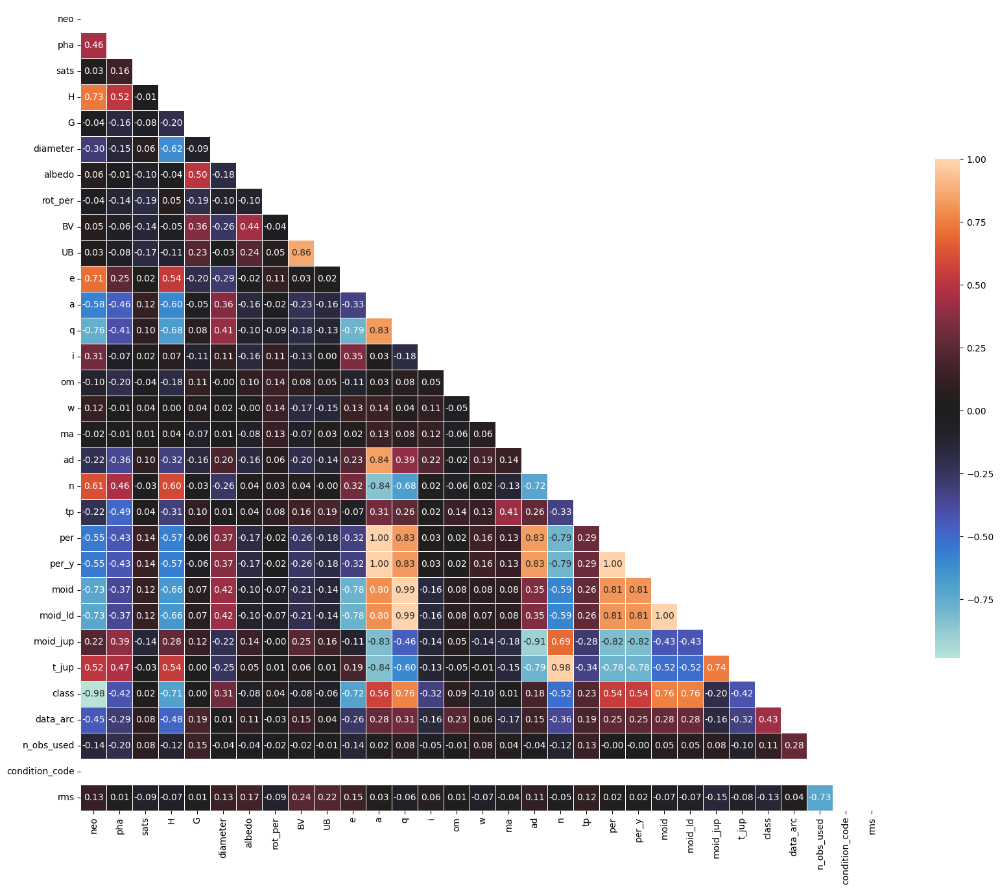

In [50]:
#a_corr = df_asteroid.corr()   #calculate the correlations between cols
mask = np.triu(np.ones_like(asteroid_not_cleaned.drop(columns=non_numeric_col).dropna().corr(), dtype=bool))     #create mask to hide repeated mirrored info
f, ax = plt.subplots(figsize=(20, 20))         #define the size of the heatmap

#draw the heatmap
a_heatmap=sns.heatmap(asteroid_not_cleaned.drop(columns=non_numeric_col).dropna().corr(), 
                      mask=mask, vmax=1.0, 
                      center=0, square=True, 
                      linewidths=.4, cbar_kws={"shrink": .5}, annot=True, fmt=".2f")

## Asteroid Color df

In [51]:
asteroid_color = asteroid_not_cleaned.loc[:, ['spkid', 'pha', 'albedo', 'diameter', 'BV', 'UB', 'spec_B', 'spec_T', 'class']]
asteroid_color.dropna(subset=['BV', 'UB', 'spec_B', 'spec_T'], how='all', inplace = True)
asteroid_color

,spkid,pha,albedo,diameter,BV,UB,spec_B,spec_T,class
0,20000001,0,0.0900,939.400,0.713,0.426,C,G,8
1,20000002,0,0.1550,513.000,0.635,0.284,B,B,8
2,20000003,0,0.2140,246.596,0.824,0.433,Sk,S,8
3,20000004,0,0.4228,525.400,0.782,0.492,V,V,8
4,20000005,0,0.2740,106.699,0.826,0.411,S,S,8
...,...,...,...,...,...,...,...,...,...
1356305,20003248,0,0.0500,36.553,NaN,NaN,D,NaN,10
1356306,20003254,0,0.0730,31.104,NaN,NaN,T,NaN,10
1359022,20096177,0,NaN,3.400,NaN,NaN,NaN,D,10
1367442,20405058,0,0.1810,5.600,NaN,NaN,X,NaN,10


In [52]:
asteroid_color.to_csv("data/Asteroid_color_df.csv", index = False)

In [53]:
asteroid_not_cleaned.drop(['BV', 'UB', 'G', 'spec_B', 'rot_per', 'spec_T', 'spec_B', 'condition_code', 'two_body'], axis = 1, inplace = True)

In [54]:
new_non_numeric_col = ['full_name', 'orbit_id', 'epoch', 'epoch_mjd', 'epoch_cal', 'equinox', 'tp_cal', 'first_obs', 'last_obs', 'last_obs', 'producer'] 

In [55]:
null_count_2 = pd.DataFrame()
null_count_2 = asteroid_not_cleaned.isnull().sum()
columns_with_nulls_2 = null_count_2[null_count_2 > 0]
print(columns_with_nulls_2)

H              1001
diameter    1265415
albedo      1266540
ma                1
ad                2
per               2
per_y             2
moid          15398
moid_ld       15398
moid_jup      15398
t_jup             2
data_arc       2837
rms               2
dtype: int64


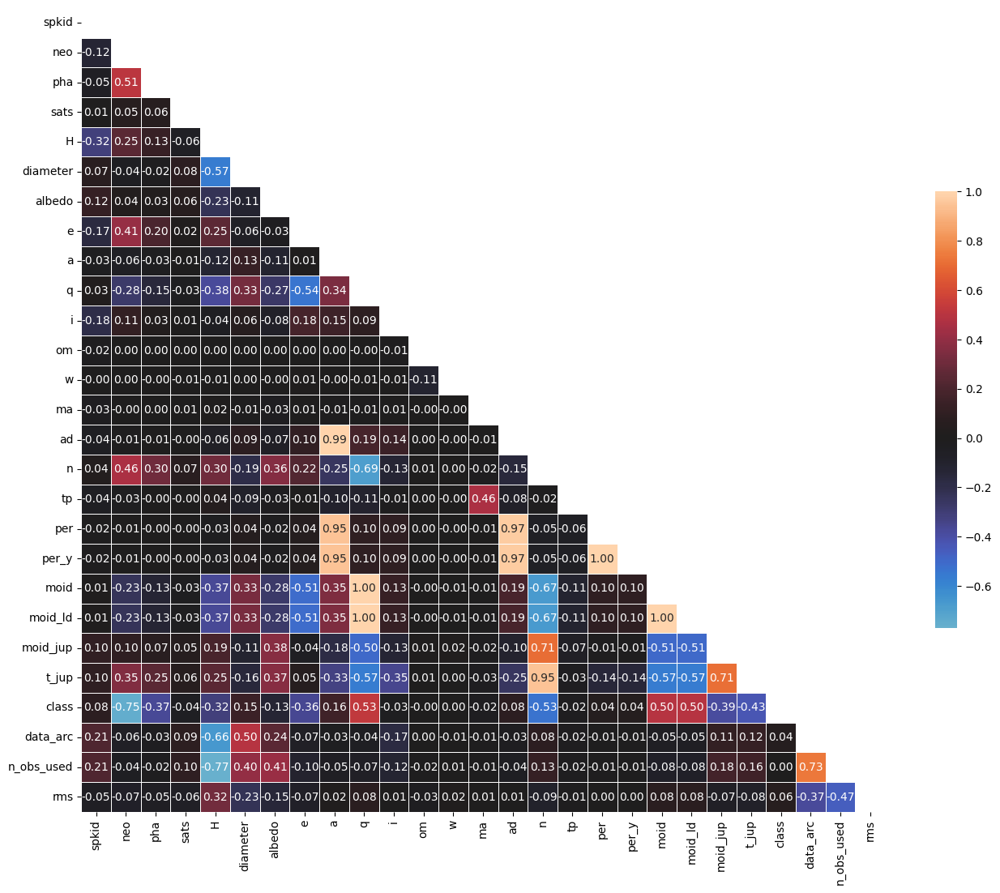

In [56]:
mask = np.triu(np.ones_like(asteroid_not_cleaned.drop(columns=new_non_numeric_col).dropna().corr(), dtype=bool))     #create mask to hide repeated mirrored info
f, ax = plt.subplots(figsize=(16, 14))         #define the size of the heatmap

#draw the heatmap
a_heatmap=sns.heatmap(asteroid_not_cleaned.drop(columns=new_non_numeric_col).dropna().corr(), 
                      mask=mask, vmax=1.0, 
                      center=0, square=True, 
                      linewidths=.5, cbar_kws={"shrink": .5}, 
                      annot=True, fmt=".2f")
plt.savefig(f'heatmap_asteroid_all.png')

## Normalize data for heat map

In [57]:
asteroid_normalized = asteroid_not_cleaned.dropna()
asteroid_normalized

,spkid,full_name,neo,pha,sats,H,diameter,albedo,orbit_id,epoch,...,moid_ld,moid_jup,t_jup,class,producer,data_arc,first_obs,last_obs,n_obs_used,rms
0,20000001,1 Ceres (A801 AA),0,0,0,3.34,939.400,0.0900,48,2460600.5,...,617.0,2.09,3.310,8,Davide Farnocchia,9520.0,1995-01-05,2021-01-28,1075,0.43153
1,20000002,2 Pallas (A802 FA),0,0,0,4.12,513.000,0.1550,JPL 65,2460600.5,...,479.0,1.85,3.040,8,Otto Matic,80309.0,1804-08-27,2024-07-13,9724,0.35797
2,20000003,3 Juno (A804 RA),0,0,0,5.18,246.596,0.2140,JPL 139,2460600.5,...,404.0,2.19,3.300,8,Otto Matic,80222.0,1804-10-17,2024-06-07,8269,0.35432
3,20000004,4 Vesta (A807 FA),0,0,0,3.25,525.400,0.4228,36,2460600.5,...,443.0,2.46,3.540,8,Davide Farnocchia,25743.0,1950-09-23,2021-03-17,9451,0.40095
4,20000005,5 Astraea (A845 XA),0,0,0,6.99,106.699,0.2740,JPL 140,2460600.5,...,431.0,1.97,3.400,8,Otto Matic,65184.0,1845-12-15,2024-06-03,4204,0.48751
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1401898,3547316,(2010 BK118),0,0,0,10.30,46.400,0.0680,16,2460600.5,...,2000.0,1.18,-2.460,12,Otto Matic,2282.0,2010-01-30,2016-04-30,309,0.45061
1401906,3516402,(2010 GW64),0,0,0,14.90,6.420,0.0470,5,2460600.5,...,1080.0,1.33,-0.537,12,Otto Matic,252.0,2010-04-06,2010-12-14,38,0.57374
1401908,3517549,(2010 GW147),0,0,0,13.29,15.900,0.0370,12,2460600.5,...,1820.0,1.33,-0.447,12,Otto Matic,1333.0,2009-07-19,2013-03-13,131,0.79816
1401913,3523334,(2010 JH124),0,0,0,14.60,7.040,0.0520,6,2460600.5,...,758.0,1.16,1.270,12,Otto Matic,474.0,2010-05-12,2011-08-29,60,0.47953


In [58]:
scaler = RobustScaler()
col_to_norm = ['H', 'diameter', 'albedo', 'e', 'a', 'q', 'i', 'om', 'w', 'ma', 'ad', 'n', 'tp', 'per', 'per_y', 'moid', 'moid_jup', 't_jup', 'data_arc', 'rms']
asteroid_normalized[col_to_norm] = scaler.fit_transform(asteroid_normalized[col_to_norm])

C:\Users\stack\AppData\Local\Temp\ipykernel_13764\2916916705.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asteroid_normalized[col_to_norm] = scaler.fit_transform(asteroid_normalized[col_to_norm])


In [59]:
asteroid_normalized.to_csv("data/Asteroid_normalized_df.csv", index = False)

In [60]:
#https://seaborn.pydata.org/generated/seaborn.pairplot.html
import itertools

def chunks(df, n):
    """Divide a pandas DataFrame `df` into `n` row chunks"""
    df_iter = iter(range(0, len(df), n))  # Create an iterator based on row indices
    while True:
        start = next(df_iter, None)
        if start is None:
            return
        yield df.iloc[start:start + n]  # Return a DataFrame slice

Without the use of chunks and itertools this code would not execute. 

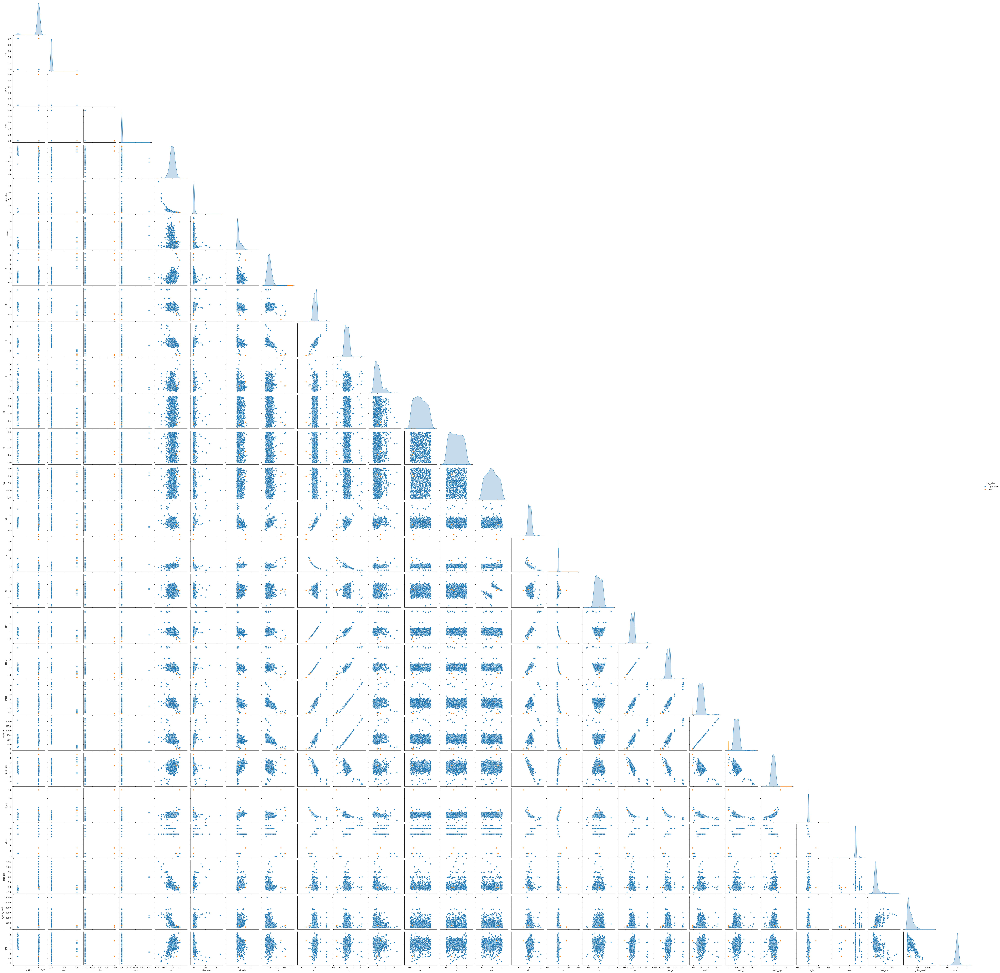

Execution time: 58.05 seconds


<Figure size 640x480 with 0 Axes>

In [61]:
start_time = time.time() 

chunk_size = 50000
sampled_chunks = []

for chunk in chunks(asteroid_normalized.drop(columns=new_non_numeric_col), chunk_size):
    sampled_chunk = chunk.sample(frac=0.005, random_state=42)
    sampled_chunks.append(sampled_chunk)

combined_sampled_data = pd.concat(sampled_chunks, ignore_index=True)

combined_sampled_data['pha_label'] = combined_sampled_data['pha'].apply(lambda x: 'Red' if x == 1 else 'LightBlue')
sns.pairplot(combined_sampled_data, corner=True, hue='pha_label')
plt.show()
plt.savefig(f'pairplot_chunk_50000_asteroid_normalized.png')
#plt.close()

end_time = time.time()
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

# New DF where there is a stronger correlation with PHA based on the previous correlation calculation

In [62]:
select_cols = ['pha', 'neo', 'H', 'e', 'q', 'n', 'moid', 'diameter', 'albedo', 'a', 'i']
asteroid_normalized_small = asteroid_normalized[select_cols]
asteroid_normalized_small['spkid'] = asteroid_not_cleaned['spkid']
asteroid_normalized_small['full_name'] = asteroid_not_cleaned['full_name']
asteroid_normalized_small.to_csv("data/asteroid_normalized_small_df.csv", index = False)
asteroid_normalized_small

C:\Users\stack\AppData\Local\Temp\ipykernel_13764\3643035550.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asteroid_normalized_small['spkid'] = asteroid_not_cleaned['spkid']
C:\Users\stack\AppData\Local\Temp\ipykernel_13764\3643035550.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asteroid_normalized_small['full_name'] = asteroid_not_cleaned['full_name']


,pha,neo,H,e,q,n,moid,diameter,albedo,a,i,spkid,full_name
0,0,0,-7.411043,-0.608738,0.289176,-0.009788,0.306452,314.112492,0.088235,0.010929,0.149533,20000001,1 Ceres (A801 AA)
1,0,0,-6.932515,0.859223,-0.382876,-0.017945,-0.258065,170.929147,0.566176,0.016393,2.991822,20000002,2 Pallas (A802 FA)
2,0,0,-6.282209,1.108738,-0.618740,0.181077,-0.564516,81.471793,1.000000,-0.165756,0.429907,20000003,3 Juno (A804 RA)
3,0,0,-7.466258,-0.503883,-0.357027,0.928222,-0.403226,175.093015,2.535294,-0.728597,-0.253505,20000004,4 Vesta (A807 FA)
4,0,0,-5.171779,0.440777,-0.444265,0.384992,-0.451613,34.494963,1.441176,-0.336976,-0.461449,20000005,5 Astraea (A845 XA)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1401898,0,0,-3.141104,8.195146,6.101777,-3.502333,6.048387,14.246810,-0.073529,795.153005,15.725467,3547316,(2010 BK118)
1401906,0,0,-0.319018,7.751456,2.129241,-3.470979,2.258065,0.821692,-0.227941,107.539162,11.220794,3516402,(2010 GW64)
1401908,0,0,-1.306748,8.038835,4.859451,-3.497338,5.290323,4.005037,-0.301471,320.107468,10.549065,3517549,(2010 GW147)
1401913,0,0,-0.503067,7.960194,0.447496,-3.476215,0.903226,1.029886,-0.191176,121.236794,5.149533,3523334,(2010 JH124)


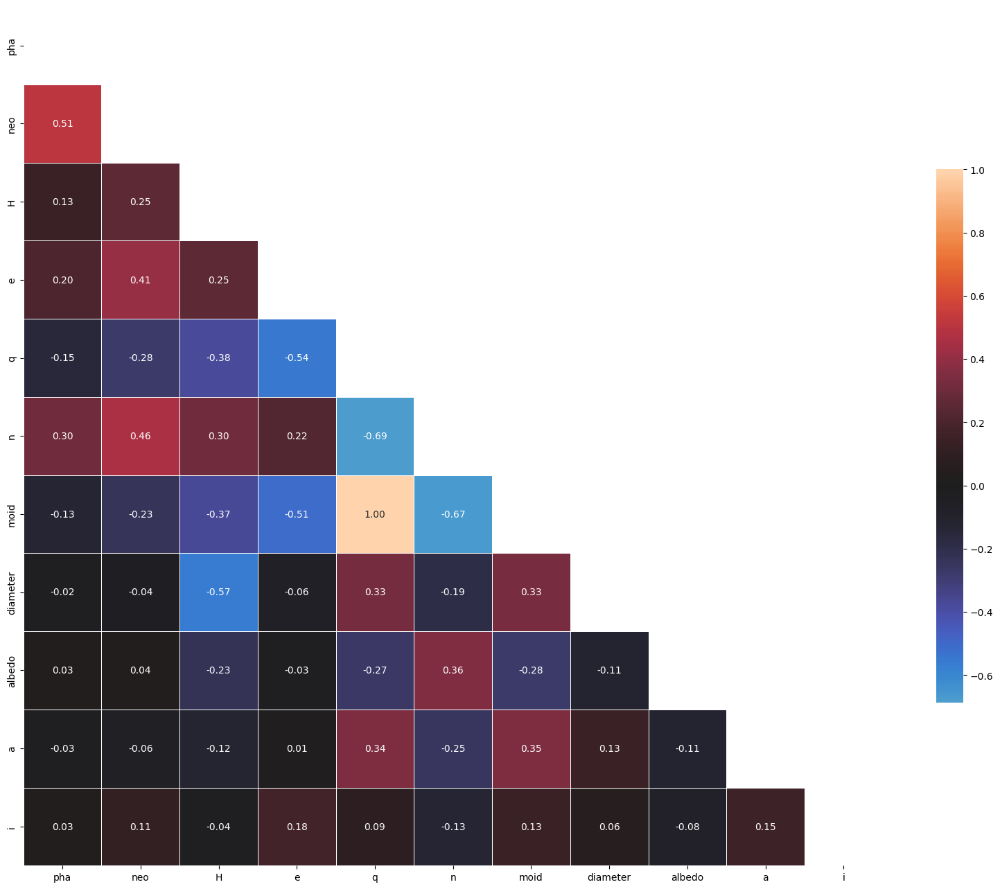

In [63]:
ref_col = ['spkid', 'full_name']
mask = np.triu(np.ones_like(asteroid_normalized_small.drop(columns = ref_col).corr(), dtype=bool))     #create mask to hide repeated mirrored info
f, ax = plt.subplots(figsize=(20, 20))         #define the size of the heatmap

#draw the heatmap
a_heatmap=sns.heatmap(asteroid_normalized_small.drop(columns = ref_col).corr(), 
                      mask=mask, vmax=1.0, center=0, square=True, 
                      linewidths=.5, cbar_kws={"shrink": .5}, 
                      annot=True, fmt=".2f")
plt.savefig(f'heatmap_asteroid_normalized_small.png')

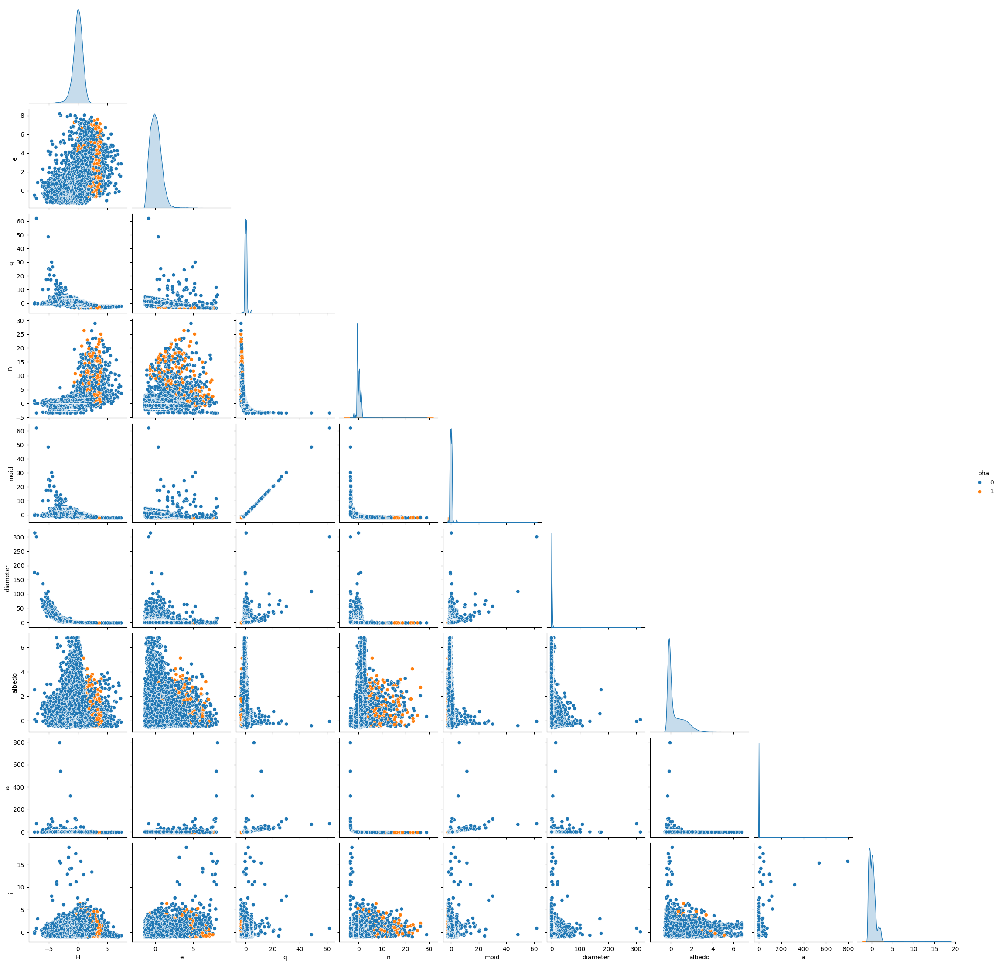

Execution time: 161.86 seconds


In [64]:
start_time = time.time() 

exclude_col = ['neo', 'spkid', 'full_name']

sns.pairplot(asteroid_normalized_small.drop(columns=exclude_col), corner=True, hue='pha')
plt.show()
plt.savefig(f'pairplot_asteroid_normalized.png')
plt.close()

end_time = time.time()
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

C:\Users\stack\AppData\Local\Temp\ipykernel_13764\2880401621.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  asteroid_normalized_small['pha_neo_label'] = asteroid_normalized_small.apply(


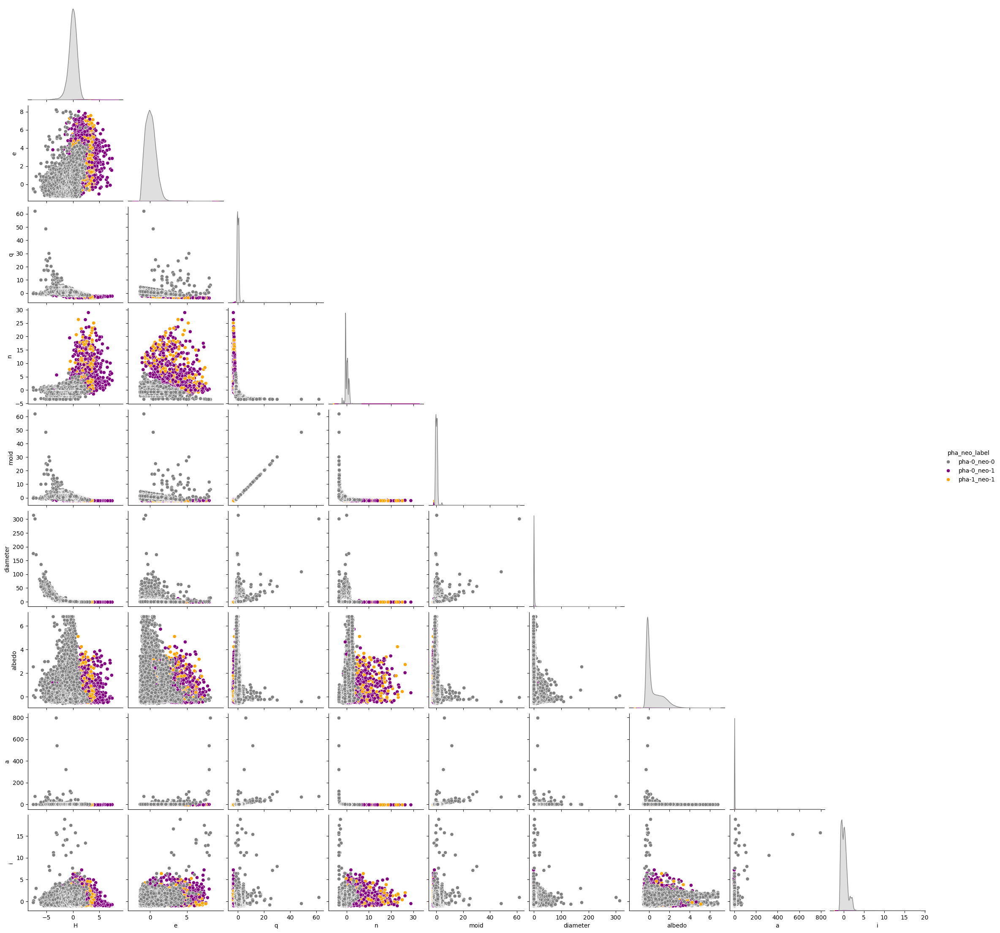

Execution time: 181.40 seconds


In [65]:
start_time = time.time() 

asteroid_normalized_small['pha_neo_label'] = asteroid_normalized_small.apply(
    lambda row: f"pha-{row['pha']}_neo-{row['neo']}", axis=1
)
exclude_col = ['neo', 'pha', 'spkid', 'full_name']
palette = {'pha-1_neo-1': 'orange', 'pha-1_neo-0': 'cyan', 'pha-0_neo-1': 'purple', 'pha-0_neo-0': 'gray'}

sns.pairplot(asteroid_normalized_small.drop(columns=exclude_col), 
             corner=True, hue='pha_neo_label', palette = palette) 
plt.show()
plt.savefig(f'pairplot_asteroid_normalized_small.png')
plt.close()

end_time = time.time()
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

In [66]:
asteroid_normalized_small['pha_neo_label'].value_counts()

pha_neo_label
pha-0_neo-0    136716
pha-0_neo-1       886
pha-1_neo-1       315
Name: count, dtype: int64

##### Based on the pairsplot and viewing of the counts, there are no PHA that are not also NEO. 
Therefore in order to be a PHA it must also be a NEO. Which is completely logical

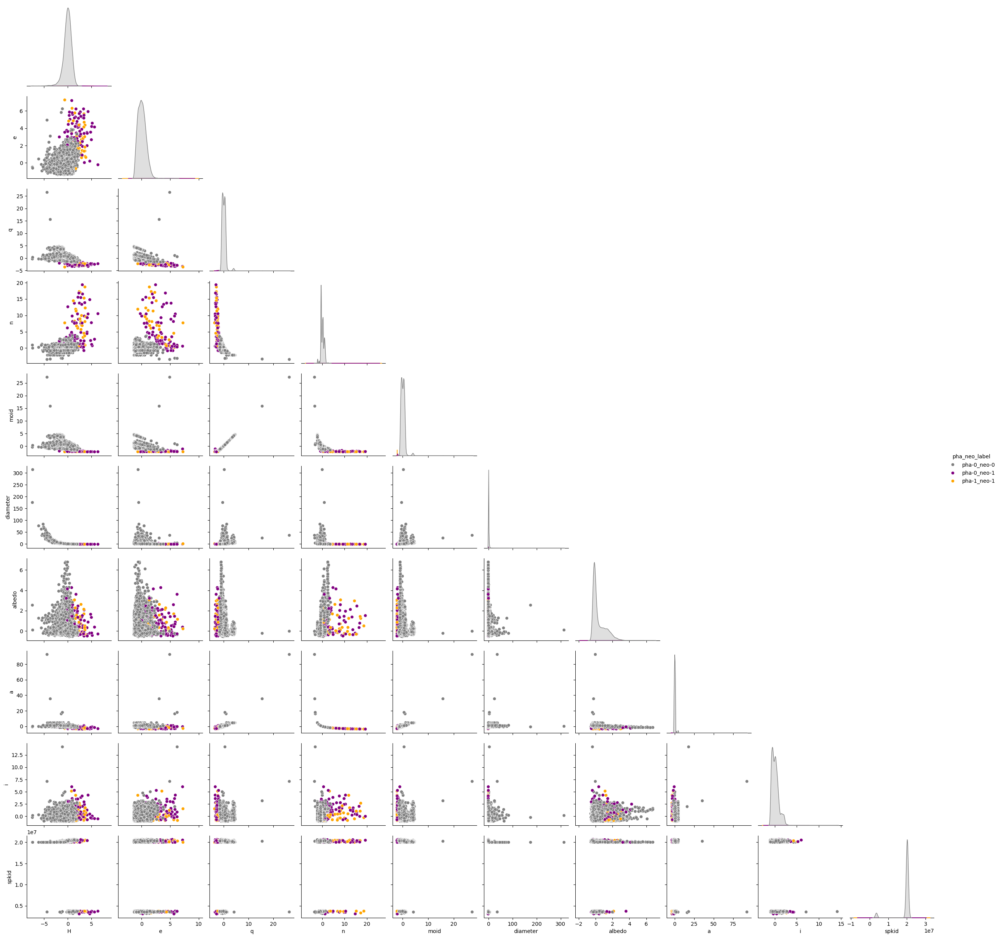

Execution time: 27.50 seconds


In [67]:
start_time = time.time() 

chunk_size = 10000
sampled_chunks = []

for chunk in chunks(asteroid_normalized_small, chunk_size):
    sampled_chunk = chunk.sample(frac=0.1, random_state=42)
    sampled_chunks.append(sampled_chunk)

combined_small_data = pd.concat(sampled_chunks, ignore_index=True)

exclude_col = ['neo', 'pha']
palette = {'pha-1_neo-1': 'orange', 'pha-1_neo-0': 'cyan', 'pha-0_neo-1': 'purple', 'pha-0_neo-0': 'gray'}

sns.pairplot(combined_small_data.drop(columns=exclude_col), 
             corner=True, hue='pha_neo_label', palette = palette) 
plt.show()
plt.savefig(f'pairplot_asteroid_normalized_small_chunk.png')
plt.close()

end_time = time.time()
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

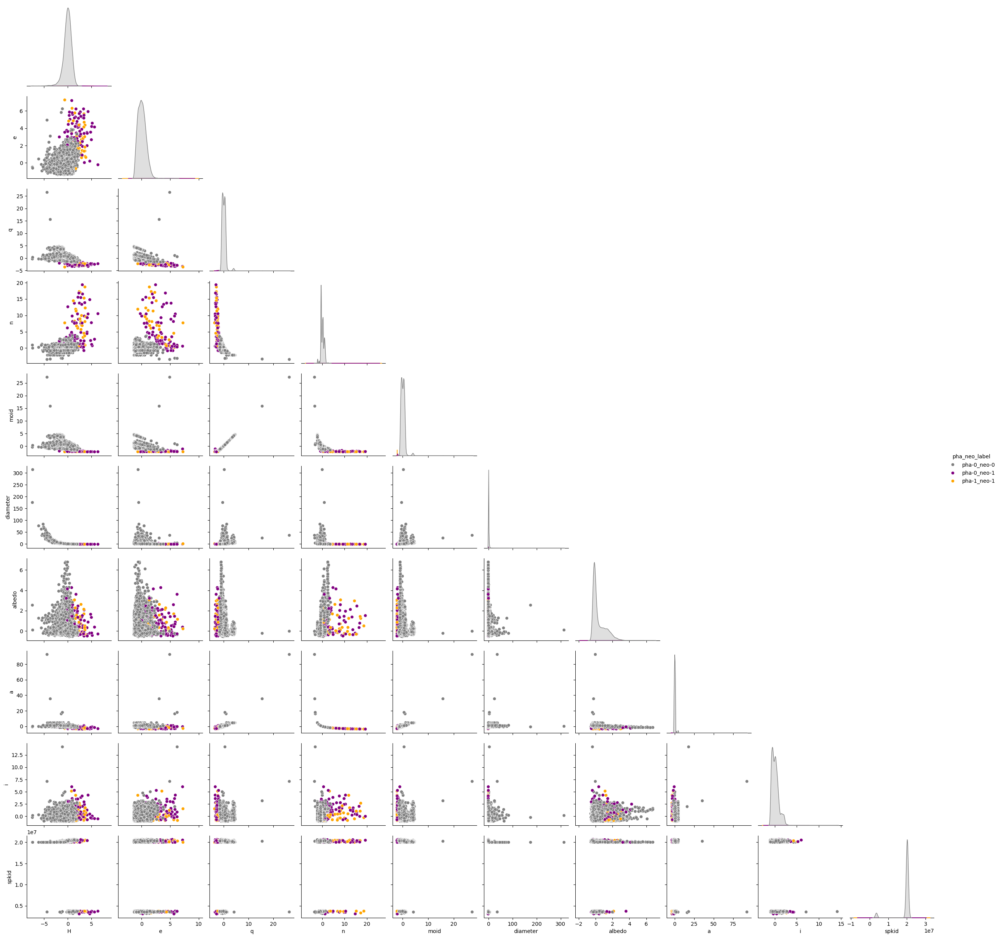

Execution time: 27.24 seconds


In [68]:
start_time = time.time() 

moid_H = asteroid_normalized[['moid', 'H', 'q', 'neo', 'pha']]

exclude_col = ['neo', 'pha']
palette = {'pha-1_neo-1': 'orange', 'pha-1_neo-0': 'cyan', 'pha-0_neo-1': 'purple', 'pha-0_neo-0': 'gray'}

sns.pairplot(combined_small_data.drop(columns=exclude_col), 
             corner=True, hue='pha_neo_label', palette = palette) 
plt.show()
plt.savefig(f'pairplot_moid-H-q.png')
plt.close()

end_time = time.time()
execution_time = end_time - start_time
print(f"Execution time: {execution_time:.2f} seconds")

# Column Name Definintion
* **spkid:** object primary SPK-ID
* **fullname:** Object full name designation
* **pdes:** Object primary designation
* **name:** Object IAU 
* **prefix:** Comet designation prefix
* **NEO:** Near-Earth Object (NEO)
* **PHA:** Potentially Hazardous Asteroid (PHA
* **sats:** Number of known satellites
* **H:** Absolute magnitude pa - An asteroid’s absolute magnitude(brightness) is the visual magnitude an observer would record if the asteroid were placed 1 Astronomical Unit (au) away, and 1 au from the Sun and at a zero phase angle
* **G:** Magnitude slope parameter - brighness slop parameter
* **M1:** Comet total magnitude parameter - total comet brightness
* **M2:** Comet nuclear magnitude parameter - comet nucleus brightness minus dust and gas surrounding it
* **K1:** Comet total magnitude slope parameter
* **K2:** Comet nuclear magnitude slope parameter
* **PC:** Comet nuclear magnitude law-phase coefficient
* **Diameter:** object diameter (from equivalent sphere)
* **extent:** object bi/tri-axial ellipsoid dimensions (km)
* **Albedo:** Geometr - Albedo is ratio of the light received by a body to the light reflected by that body. Albedo values range from 0 (pitch black) to 1 (perfect reflector)
* **rot_per:** rotation period
* **GM:** standard gravitational parameter: product of the mass (M) and the gravitational constant (G) [km^3/s^2]
* **BV:** color index B-V magnitude difference - ranges from a blue at -0.33 to orange at 1.40
* **UB:** color index U-B magnitude difference - ranges from a blue at -1.19 to orange at 1.22
* **IR:** color index I-R magnitude difference - ranges from a blue at -0.32 to orange at 0.91
* **spec_B:** spectral taxonomic type (SMASSII) - based on their reflectance spectrum, color, and sometimes albedo.
* **spec_T:** spectral taxonomic type (Tholen) - based on their reflectance spectrum, color, and sometimes albedo.
* nty in object diameter km Unit
* **Orbit_id:** Orbit selution ID
* **Epoch:** Epoch of o in modified Jul
* **epoch_mjd:** epoch of osculation in modified Julian day form (TBD)
* **epoch_cal:** epoch of osculation in calander date/time form (TBD)
* **Equinox:** An orbital parameter describing the eccentricity of the orbit ellipse. Eccentricity e is the ratio of half the distance between the foci c to the semi-major axis a: e=c/a. For example, an orbit with e=0 is circular, e=1 is parabolic, and e between 0 and 1 is elliptic.
* **e:** Eccentricity
* **a:** Semi-major axis au Unit
* **q:** perihelion distance au Unit
* **i:** inclination; angle with respe
* **om:** longitude of the ascending node(deg)
* **w:** argument of perihelion(deg) - Angle in the orbit plane between the ascending node and the perihelion point(orbit’s closest point to the sun).
* **ma:** mean anamoly (deg)
* **as:** aphelion distance (au) - An orbit’s farthest point to the Sun.
* **n:** mean motion (deg/d)
* **tp:** Time of pe - The time at which an object is at perihelion (its closest distance to the sun).
* **tp_cal:** time of perihelion passage cal (TBD)
* **per:** sidereal orbital period (d)
* **per_y:** sidereal orbital period (years)
* **moid:** Earth minimun orbit intersection distance (au)
* **moid_ld:** Earth Minimum Orbit Int
* **moid_jup:** Jupyter minimum orbit Intersection dis (au)gma_per:** sidereal orbital period (1-sigma uncertainty)(d)
* **class:** orbital class
* **producer:** name of person or institution who computed the orbit
* **data_arc:** number of days spanned by the data-arc(d)
* **first_obs:** date of the first observation used in the orbit fit(UT)
* **last_obs:** date of the last observatin used in the orbit fit (UT)
* **n_obs_used:** number of observations (all types) used in filer-radar observations used in fit
* **condition_code:** orbit condition code (MPC 'U' parameter)
* **rms:** normalized RMS of orbit fit (arcsec)
* **two_body:** 2-body dynamics used flag
* **A1:** non-grav. radial parameter
y)
* **A2:** non-grav. transverse parametey)
* **A3:** non-grav. normal paramermal parameter (1-sigma uncertainty)
* **DT:** non-grav. peri-maximun of621fd1a06.png)

![image.png](attachment:53bf78d6-9835-4298-952d-26730e2a6836.png)
